In [0]:
!pip install SimpleITK
!git clone https://github.com/EPU-IA-2020/TP3.git


In [0]:
import torch
import torch.nn as nn
import torch.utils.data
import torch.utils.tensorboard
import torchvision
import torchvision.transforms
import os
import time
import numpy as np
import skimage.transform
import matplotlib.pyplot as plt
import SimpleITK as sitk
import pandas as pd
import sklearn.model_selection as model_selection
from tqdm import tqdm

  # Part 1 : Study of the data

First, we will study the data. 

The data is stored in the folder /content/epu_ia_2019/data.

For a patient BraTS19_EXAMPLE, you will have a folder /content/epu_ia_2019/BraTS19_EXAMPLE. Inside this folder you will have nifti files (.nii.gz) for eacch modalities and each z slice. 

The train, validation and test split are stored in the folder /content/epu_ia_2019/datasets. For each split, you will have a text files with a list of patient

##Exercice 1 : Train, Validation and Test Set

Complete the following code to :
*   Load the train, validation and test set
*   Print the first 5 patients of the train set
*   Print the lenght of the train, validation and test set


In [0]:
import os
path = '/content/TP3/'
train_set = np.loadtxt(path + 'datasets/train.txt',dtype=str)
validation_set = np.loadtxt(path + 'datasets/val.txt',dtype=str)
test_set = np.loadtxt(path + 'datasets/test.txt',dtype=str)

# Train_set, validation_set and test_set are list of patients
print('Train set : {}'.format(train_set[:5])) # Print the first 5 patients of train_set
print('Train set lenght : {}'.format(len(train_set)))
print('Validation set lenght : {}'.format(len(validation_set)))
print('Test set lenght : {}'.format(len(test_set)))

Train set : ['BraTS19_CBICA_BHQ_1' 'BraTS19_CBICA_AQV_1' 'BraTS19_CBICA_ATN_1'
 'BraTS19_TCIA01_335_1' 'BraTS19_CBICA_ASY_1']
Train set lenght : 251
Validation set lenght : 42
Test set lenght : 42


[Solution](#scrollTo=u2vHeEG1yIhT&line=15&uniqifier=1)
##Exercice 2 : Content of the data folder

Complete the following code to :
*   Print the first 5 patients in the data folder
*   Print the lenght of the data folder
*   Select a patient and print the number of images inside the patient folder
* Print the number of z slices for one patient
* Print the 5 first images of a patient

In [0]:
# The data is store in the folder /content/epu_ia_2019/data/
data_path = '/content/TP3/data/'
files = os.listdir(data_path) # All the files in the folder /content/epu_ia_2019/data/
print('Content of the folder : {}'.format(files[:5]))
print('Lenght of the folder : {}'.format(len(files)))

# For each patient we have 4 modality and the segmentation in the folder :
# t1, t2, flair, t1_ce (gado) and seg. 
# We also have a file for each slice along the z axis ()
patient = 'BraTS19_2013_0_1/'
patient_path = os.path.join(data_path, patient)
patient_files = os.listdir(patient_path)
print('Number of files for each patient : {}'.format(len(patient_files) ))
print('Number of slices : {}'.format(len(patient_files) / 5))
print('The first five files of the folder : {}'.format(patient_files[:5]))

Content of the folder : ['BraTS19_TCIA13_650_1', 'BraTS19_CBICA_ASW_1', 'BraTS19_CBICA_BGR_1', 'BraTS19_TCIA01_499_1', 'BraTS19_TCIA13_618_1']
Lenght of the folder : 336
Number of files for each patient : 390
Number of slices : 78.0
The first five files of the folder : ['BraTS19_2013_0_1_t2_z_4.nii.gz', 'BraTS19_2013_0_1_flair_z_22.nii.gz', 'BraTS19_2013_0_1_seg_z_45.nii.gz', 'BraTS19_2013_0_1_flair_z_18.nii.gz', 'BraTS19_2013_0_1_t2_z_32.nii.gz']


[Solution](#scrollTo=OY9dNbVY6u29)
##Exercice 3 : Study of medical images

Medical images are stored in specific data type such as dicom or nifti. 
Theses data types contain not only the images but also medical information. 
There are many Python librairy to load medical data. We will use SimpleITK.


Complete the following code to :
*   Print the first 5 patients in the data folder
*   Print the lenght of the data folder
*   Select a patient and print the number of images inside the patient folder
* Print the number of z slices for one patient
* Print the 5 first images of a patient


In [0]:
import os
import SimpleITK as sitk
orig_data_path = '/content/TP3/origin_data/'

patients = ['BraTS19_CBICA_ANP_1', 'BraTS19_CBICA_AWV_1', 'BraTS19_TCIA01_131_1',
            'BraTS19_TCIA10_442_1']

modalities = ['_t1', '_t2', '_flair', 't1ce', 'seg']
suffix = '.nii.gz'
patient = patients[0]
modality = modalities[0]
patient_folder = os.path.join(orig_data_path,patient) 
# We use the librairy sitk to open the nifti images
image = sitk.ReadImage(os.path.join(patient_folder, patient + modality + suffix))

print(type(image))
# Print geometrical information
print('Image Direction : {}'.format(image.GetDirection()))
print('Image Spacing : {}'.format(image.GetSpacing()))
print('Image Origin : {}'.format(image.GetOrigin()))

print(image.GetPixel(0, 0, 0))

# Get all the information in the meta data
keys = image.GetMetaDataKeys()
print('Metadata :')
for key in keys:
  print('{} : {}'.format(key, image.GetMetaData(key)))

# Convert the sitk image 
array = sitk.GetArrayFromImage(image)
print(type(array)) # Type of the image
print(array.shape)
print(array[0, 0, 0])

<class 'SimpleITK.SimpleITK.Image'>
Image Direction : (1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0)
Image Spacing : (1.0, 1.0, 1.0)
Image Origin : (-0.0, -239.0, 0.0)
0
Metadata :
ITK_FileNotes : 
aux_file : 
bitpix : 16
cal_max : 0
cal_min : 0
datatype : 4
descrip : 
dim[0] : 3
dim[1] : 240
dim[2] : 240
dim[3] : 155
dim[4] : 1
dim[5] : 1
dim[6] : 1
dim[7] : 1
dim_info :  
intent_code : 0
intent_name : 
intent_p1 : 0
intent_p2 : 0
intent_p3 : 0
pixdim[0] : 1
pixdim[1] : 1
pixdim[2] : 1
pixdim[3] : 1
pixdim[4] : 0
pixdim[5] : 0
pixdim[6] : 0
pixdim[7] : 0
qform_code : 1
qform_code_name : NIFTI_XFORM_SCANNER_ANAT
qoffset_x : 0
qoffset_y : 239
qoffset_z : 0
quatern_b : 0
quatern_c : 0
quatern_d : 1
scl_inter : 0
scl_slope : 0
sform_code : 1
sform_code_name : NIFTI_XFORM_SCANNER_ANAT
slice_code :  
slice_duration : 0
slice_end : 0
slice_start : 0
srow_x : -1 -0 -0 0
srow_y : -0 -1 -0 239
srow_z : 0 0 1 0
toffset : 0
vox_offset : 2880
xyzt_units : 
<class 'numpy.ndarray'>
(155, 240, 240)
0

[Solution](#scrollTo=Xr_eczPv7Jq9&line=37&uniqifier=1)

## Exercice 4 : Comparaison between original data and processed data

In order to accelerate the calculation time and have good results quickly, we will work on small images of shape (96, 96). The original images of the dataset have a shape (155, 240, 240) where the 155 correspond to the number of slice on the z axis.

The step to pass from the original images to the images we will use are :
- Crop the images to a shape of (155, 192, 192)
- Downsample the images by interpolation of scale 0.5 (https://scikit-image.org/docs/dev/auto_examples/transform/plot_rescale.html) to a shape of (77, 96, 96)
- Save all the z slice independantly in a new array of shape (96, 96)

Complete the following code to plot side by side one slice of the original images and the preprocessed images. Print also the shape of the original images and the preprocessed images. You should use the functions : sitk.ReadImage, sitk.GetArrayFromImage, shape, plt.imshow, plt.title, plt.subplot

Change the z parameter to plot different slice of the images 

Orig array shape : (155, 240, 240)
Processed array shape : (96, 96)


Text(0.5, 1.0, 'Processed array')

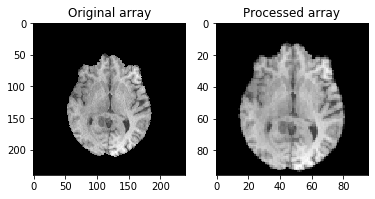

In [0]:
import matplotlib.pyplot as plt

orig_data_path = '/content/TP3/origin_data/'
patient = patients[0]
modality = modalities[0]
patient_folder = os.path.join(orig_data_path,patient) 
# We use the librairy sitk to open the nifti images
image = sitk.ReadImage(os.path.join(patient_folder, patient + modality + suffix))
orig_array = sitk.GetArrayFromImage(image)
print('Orig array shape : {}'.format(orig_array.shape))

###
data_path = '/content/TP3/data/'
patient_folder = os.path.join(data_path,patient)
z_slice = 35
path = os.path.join(patient_folder, patient + modality + '_z_' + str(z_slice) + suffix)
image = sitk.ReadImage(path)
processed_array = sitk.GetArrayFromImage(image)
print('Processed array shape : {}'.format(processed_array.shape))

plt.subplot(1, 2, 1)
plt.imshow(orig_array[z_slice*2, :, :], cmap='gray')
plt.title('Original array')
plt.subplot(1, 2, 2)
plt.imshow(processed_array, cmap='gray')
plt.title('Processed array')


[Solution](#scrollTo=GeuCzQ2m7PNy&line=27&uniqifier=1)


# Part 2 : Creation of the neural network

The network we will use is called UNet. It is famous network for medical image segmentation. In this part, we will create the network and train our first neural network. You can study the shape of the UNet in the figure 1 of the paper **U-Net: Convolutional Networks for Biomedical Image Segmentation** (https://arxiv.org/pdf/1505.04597.pdf). The UNet has two main features : First the size of the image is downsample by 2 in each block by a layer called **MaxPooling**. Secondly in order to keep information of high resolution, we use **skip-connection** to pass the information from the left part of the network to the right part.

## Exercice 5 : Create the network

- Complete the function DownConvBlock and UpConvBlock. You should use the different layers function from tensorflow which are imported in the code.
- Try to compare the following code with the figure 1 of the paper. Where are the DownConvBlock, the UpConvBlock ?


In [0]:
def get_activation(activation_type):
    activation_type = activation_type.lower()
    if hasattr(nn, activation_type):
      return getattr(nn, activation_type)()
    else:
      return nn.ReLU()

def _make_nConv(in_channels, out_channels, nb_Conv, activation='ReLU'):
  layers = []
  layers.append(ConvBatchNorm(in_channels, out_channels, activation))

  for _ in range(nb_Conv-1):
      layers.append(ConvBatchNorm(out_channels, out_channels, activation))
  return nn.Sequential(*layers)

# Question here
class ConvBatchNorm(nn.Module):
  """(convolution => [BN] => ReLU)"""
  
  def __init__(self, in_channels, out_channels, activation='ReLU'):
    super(ConvBatchNorm, self).__init__()
    self.conv = nn.Conv2d(in_channels, out_channels, 
                          kernel_size=3, padding=1)
    self.norm = nn.BatchNorm2d(out_channels)
    self.activation = get_activation(activation)
      
  def forward(self, x):
    out = self.conv(x)
    out = self.norm(out)
    return self.activation(out)

class DownBlock(nn.Module):
  """Downscaling with maxpool convolution"""

  def __init__(self, in_channels, out_channels, nb_Conv, activation='ReLU'):
    super(DownBlock, self).__init__()
    self.maxpool = nn.MaxPool2d(2)
    self.nConvs = _make_nConv(in_channels, out_channels, nb_Conv, activation)
        
  def forward(self, x):
    out = self.maxpool(x)
    return self.nConvs(out)  

class UpBlock(nn.Module):
  """Upscaling then conv"""

  def __init__(self, in_channels, out_channels, nb_Conv, activation='ReLU'):
    super(UpBlock, self).__init__()
        
    self.up = nn.Upsample(scale_factor=2)
    self.nConvs = _make_nConv(in_channels, out_channels, nb_Conv, activation)

  def forward(self, x, skip_x):
    out = self.up(x)
    x = torch.cat([out, skip_x], dim=1) # dim 1 is the channel dimension
    return self.nConvs(x)

In [0]:
class UNet(nn.Module):
  def __init__(self, n_channels, n_classes):
    '''
    n_channels : number of channels of the input. 
                    By default 4, because we have 4 modalities
    n_labels : number of channels of the ouput.
                  By default 4 (3 labels + 1 for the background)
    '''
    super(UNet, self).__init__()
    self.n_channels = n_channels
    self.n_classes = n_classes
    # Question here
    self.inc = ConvBatchNorm(n_channels, 64)
    self.down1 = DownBlock(64, 128, nb_Conv=2)
    self.down2 = DownBlock(128, 256, nb_Conv=2)
    self.down3 = DownBlock(256, 512, nb_Conv=2)
    self.down4 = DownBlock(512, 512, nb_Conv=2)
    self.up1 = UpBlock(1024, 256, nb_Conv=2)
    self.up2 = UpBlock(512, 128, nb_Conv=2)
    self.up3 = UpBlock(256, 64, nb_Conv=2)
    self.up4 = UpBlock(128, 64, nb_Conv=2)
    self.outc = nn.Conv2d(64, n_classes, kernel_size=3, stride=1, padding=1)
    self.last_activation = get_activation('Softmax')

  def forward(self, x):
    # Question here
    x1 = self.inc(x)
    x2 = self.down1(x1)
    x3 = self.down2(x2)
    x4 = self.down3(x3)
    x5 = self.down4(x4)
    x = self.up1(x5, x4)
    x = self.up2(x, x3)
    x = self.up3(x, x2)
    x = self.up4(x, x1)
    logits = self.last_activation(self.outc(x))
    return logits

[Solution](#scrollTo=kklQ7CXx_-ns&line=40&uniqifier=1)

## Exercice 6 : Study the model 

To study and debug a neural network, keras offers to solution : 

Execute the following code and answer the following question.
- What are the number of convolutionnal layer in our model ?
- What is the number of parameters in our model ?
- What is the layer with the biggest number of parameters ? Try to find the formula to calculate the number of parameters.

In [0]:
model = UNet(n_channels=4, n_classes=4)

print(model)

# Image of size 96*96 with 4 modality + batch size = 1
x = torch.from_numpy(np.random.randn(1, 4, 96, 96)).float()
y = model(x)
print(y.shape)


torch.Size([1, 5, 96, 96])


[Solution](#scrollTo=dj4y-_7DM7r9&line=40&uniqifier=1)
## CODE TO EXECUTE AND HIDE

All the following code is needed to execute the model, but we don't ask you to implement it. You just need to execute it once. If you want, you can try to understand what the different functions are doing but it is not needed. 

**DATASET** This part is used to automatically load the correct images, put them in batch and applying transformation. We will also load the correct train, validation and test sets.

In [0]:
modalities = ['_t1', '_t1ce', '_t2', '_flair']
end = '.nii.gz'
seg_name = '_seg'

def load_split(split_folder):
    '''
        return train, val, test split with loadtxt
    '''
    train_split = np.loadtxt(os.path.join(
        split_folder, 'train.txt'), dtype=str)
    val_split = np.loadtxt(os.path.join(split_folder, 'val.txt'), dtype=str)
    test_split = np.loadtxt(os.path.join(split_folder, 'test.txt'), dtype=str)

    return train_split, val_split, test_split


def load_sitk(path):

    return sitk.GetArrayFromImage(sitk.ReadImage(path))


def find_z_slice(list_patient, threshold, dataframe):

    list_IDs = []

    for patient in list_patient:

        if threshold > 0:
          condition = dataframe[patient].values >= threshold
          z_slice = np.where(condition)[0]
        else:
          z_slice = range(155)
        list_IDs += list(set([(patient, int(z//2)) for z in z_slice]))

    return list_IDs


def generate_IDs(train_split, val_split, test_split,
                 tumor_percentage, csv_path, image_size=(240, 240)):

    tumor_volume_dataframe = pd.read_csv(csv_path)

    threshold = int(tumor_percentage * np.prod(image_size) / 100)

    train_IDs, val_IDs, test_IDs = [], [], []

    train_IDs = find_z_slice(train_split, threshold, tumor_volume_dataframe)
    val_IDs = find_z_slice(val_split, threshold, tumor_volume_dataframe)
    test_IDs = find_z_slice(test_split, 0, tumor_volume_dataframe)

    return train_IDs, val_IDs, test_IDs

class SegmentationDataset(torch.utils.data.Dataset):
  'Generates data for torch'

  def __init__(self, files_list, data_path, transform=None):
    'Initialization'
    super(SegmentationDataset, self).__init__()
    self.files_list = files_list
    self.transform = transform
    self.data_path = data_path

  def __len__(self):
    return len(self.files_list)

  def __getitem__(self, idx):
    'Generate one batch of data'
    # Generate indexes of the batch
    patient = self.files_list[idx]

    irm, mask = self.load(patient)
    sample = (irm, mask)
        
    if self.transform:
      irm, mask = self.transform(sample)

    return (irm, mask, patient)

  def load(self, ID):

    patient, z_slice = ID
    patient_path = os.path.join(self.data_path, patient)

    irm = []
    for modality in modalities:
      path = os.path.join(patient_path,
                          patient + modality + '_z_' + str(z_slice) + end)
                          
      irm.append(load_sitk(path))

    irm = np.stack(irm, axis=0)

    mask_path = os.path.join(patient_path,
                              patient + seg_name + '_z_' + str(z_slice) + end)
    
    mask = load_sitk(mask_path)
    mask[mask == 4] = 3
    label = 4
    mask = mask.astype(np.int16)
    mask = np.rollaxis(np.eye(label, dtype=np.uint8)[mask], -1, 0)
      
    return irm, mask

In [0]:
def to_var(x, device):
    if isinstance(x, np.ndarray):
        x = torch.from_numpy(x)
    x = x.to(device)
    return x

def to_numpy(x):
    if not (isinstance(x, np.ndarray) or x is None):
        if x.is_cuda: 
            x = x.data.cpu()
        x = x.numpy()
    return x

def save_checkpoint(state, save_path):
    '''
        Save the current model. 
        If the model is the best model since beginning of the training
        it will be copy
    '''

    if not os.path.isdir(save_path):
        os.makedirs(save_path)

    epoch = state['epoch']
    val_loss = state['val_loss']
    filename = save_path + '/' + \
        'model.{:02d}--{:.3f}.pth.tar'.format(epoch, val_loss)
    torch.save(state, filename)


def print_summary(epoch, i, nb_batch, loss, batch_time, 
                  average_loss, average_time, mode):
    '''
        mode = Train or Test
    '''
    summary = '[' + str(mode) + '] Epoch: [{0}][{1}/{2}]\t'.format(
        epoch, i, nb_batch)

    string = ''
    string += ('Dice Loss {:.4f} ').format(loss)
    string += ('(Average {:.4f}) \t').format(average_loss)
    string += ('Batch Time {:.4f} ').format(batch_time)
    string += ('(Average {:.4f}) \t').format(average_time)

    summary += string

    print(summary)


**Tensorboard** : This part is used to plot the prediction of the network during the training and study its performance.

In [0]:
def plot(irms, masks=None, pred_masks=None):
    
    kwargs = {'cmap': 'gray'}

    fig, ax = plt.subplots(2, 3, gridspec_kw={'wspace': 0.15, 'hspace': 0.2,
                                              'top': 0.85, 'bottom': 0.1,
                                              'left': 0.05, 'right': 0.95})
        
    ax[0, 0].imshow(irms[0, :, :], **kwargs)
    
    if masks is not None:
        masks = np.argmax(masks, axis=0)
        ax[0, 1].imshow(masks, vmin=0, vmax=3)
        
    if pred_masks is not None:
        pred_masks = np.argmax(pred_masks, axis=0)
        ax[0, 2].imshow(pred_masks, vmin=0, vmax=3)

    for i in range(3):
        ax[1, i].imshow(irms[i+1, :, :], **kwargs)

    for i in range(2):
        for j in range(3):
            ax[i, j].grid(False)
            ax[i, j].axis('off')
            ax[i, j].set_xticks([])
            ax[i, j].set_yticks([])

    ax[0, 0].set_title('IRM T1')
    ax[1, 0].set_title('IRM Gado')
    ax[1, 1].set_title('IRM T2')
    ax[1, 2].set_title('IRM Flair')
    
    ax[0, 1].set_title('Ground Truth Seg')
    ax[0, 2].set_title('Predicted Seg')

    fig.canvas.draw()
    
    return fig



**Loss** : This code is used to code the dice loss which is a loss function dedicated to medical segmentation. 

In [0]:
def dice_loss(input, target):
    smooth = 1.
    target = target.float()
    input = input.float()
    input_flat = input.contiguous().view(-1)
    target_flat = target.contiguous().view(-1)
    intersection = (input_flat * target_flat).sum()
    return 1 - ((2. * intersection + smooth) /
                (input_flat.pow(2).sum() + target_flat.pow(2).sum() + smooth))

def mean_dice_loss(input, target):
  
  channels = list(range(target.shape[1]))
  loss = 0
  for channel in channels:
    dice = dice_loss(input[:, channel, ...],
                     target[:, channel, ...])
    loss += dice

  return loss / len(channels)


## Exercice 7 : Main - Train the model 

To train the model in keras, you have different steps :
- Choose the optimiser, learning rate and loss function
- Create the model and compile it 
- Define callbacks to save the model, plot it, change the learning rate and so on...
- Define the data in the form of a data generator or a numpy array
- Launch the training for a number of epochs

Complete the following code and launch a training for a small number of epochs (5 or 10 for instance). 
You should see the loss decreasing. 
Then open tensorboard to visualise the decrease of the loss and the prediction of the network at the different epochs

In [0]:
# Import of the package and choice of the parameters

####### Parameters of models #######
learning_rate = 1e-4
image_size = (96, 96)
n_modality = 4
n_labels = 4
epochs = 10
batch_size = 64
print_frequency = 5
save_frequency = 10
save_model = True
tumor_percentage = 0.5
tensorboard = True
main_path = '/content/TP3/'
sets_path = os.path.join(main_path, 'datasets/')
csv_path = os.path.join(main_path, 'data/tumor_count.csv')
data_folder = os.path.join(main_path, 'data/')
save_path = '/content/save/'
loss_function = 'dice_loss'
session_name = 'Test_session' + '_' + time.strftime('%m.%d %Hh%M')
model_path = save_path + 'models/' + session_name + '/'
tensorboard_folder = save_path + 'tensorboard_logs/'

In [0]:
# Load the split, generate the IDs list and create the DataGenerator
train_split, val_split, test_split = load_split(sets_path)
(train_IDs, val_IDs,
 test_IDs) = generate_IDs(train_split, val_split, test_split,
                          tumor_percentage, csv_path)

transformation=None
train_Dataset = SegmentationDataset(train_IDs, data_path=data_folder,
                                    transform=transformation
                                    )

val_Dataset = SegmentationDataset(val_IDs, data_path=data_folder,
                                  transform=transformation
                                  )

test_Dataset = SegmentationDataset(val_IDs, data_path=data_folder,
                                  transform=transformation
                                  )
        
train_loader = torch.utils.data.DataLoader(train_Dataset, 
                                           batch_size=batch_size, shuffle=True,
                                           drop_last=True)

val_loader = torch.utils.data.DataLoader(val_Dataset,
                                         batch_size=batch_size, drop_last=True) 

test_loader = torch.utils.data.DataLoader(val_Dataset,
                                         batch_size=1, drop_last=False)    

In [0]:
# Train the model

def train_loop(loader, model, criterion, optimizer, writer, epoch):

    logging_mode = 'Train' if model.training else 'Val'
    
    end = time.time()
    time_sum, loss_sum = 0, 0
    
    for i, sample in enumerate(loader, 1):
        # Take variable and put them to GPU
        (irms, masks, patients) = sample
        # print(irms.shape) # Batch * Modality * Width * Height

        irms = to_var(irms.float(), device)
        masks = to_var(masks.float(), device)
    
        # compute output
        pred_masks = model(irms)

        # compute loss
        dice_loss = criterion(pred_masks, masks)

        # compute gradient and do SGD step
        if model.training:
            optimizer.zero_grad()
            dice_loss.backward()
            optimizer.step()

        # measure elapsed time
        batch_time = time.time() - end

        time_sum += batch_size*batch_time
        loss_sum += batch_size*dice_loss
        average_loss = loss_sum / (i * batch_size)
        average_time = time_sum / (i * batch_size)

        end = time.time()
        
        if i % print_frequency == 0:
            print_summary(epoch + 1, i, len(loader), dice_loss, batch_time,
                          average_loss, average_time, logging_mode)
        if tensorboard:
            step = epoch*len(loader) + i
            writer.add_scalar(logging_mode + '_dice', dice_loss.item(),step)

    if tensorboard:
      n = irms.shape[0]
      irms = to_numpy(irms)
      masks = to_numpy(masks)
      pred_masks = to_numpy(pred_masks)

      for batch in range(n):
        fig = plot(irms[batch, ...], 
                   masks[batch, ...], pred_masks[batch, ...])
        
        writer.add_figure(logging_mode + str(batch), 
                          fig, epoch)

    return dice_loss

In [0]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = UNet(n_channels=n_modality, n_classes=n_labels) # Create model
model.to(device) # move model to the right device

criterion = mean_dice_loss # Choose loss function
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) # Choose optimize
    
if tensorboard:
    log_dir = tensorboard_folder + session_name + '/'
    if not os.path.isdir(log_dir):
        os.makedirs(log_dir)
    writer = torch.utils.tensorboard.SummaryWriter(log_dir)
else:
    writer = None

for epoch in range(epochs):  # loop over the dataset multiple times
    print('******** Epoch [{}/{}]  ********'.format(epoch+1, epochs+1))
    print(session_name)

    # train for one epoch
    model.train()
    print('Training')
    train_loop(train_loader, model, criterion, optimizer, writer, epoch)

    # evaluate on validation set
    print('Validation')
    with torch.no_grad():
        model.eval()
        val_loss = train_loop(val_loader, model, criterion,
                              optimizer, writer, epoch)

    if save_model and epoch % save_frequency == 0:
        save_checkpoint({'epoch': epoch,
                        'state_dict': model.state_dict(),
                         'val_loss': val_loss,
                         'optimizer': optimizer.state_dict()}, model_path)
        

******** Epoch [1/11]  ********
Test_session_02.13 15h06
Training
[Train] Epoch: [1][5/106]	Dice Loss 0.7020 (Average 0.8050) 	Batch Time 1.0038 (Average 1.1163) 	
[Train] Epoch: [1][10/106]	Dice Loss 0.5781 (Average 0.7165) 	Batch Time 0.9667 (Average 1.0642) 	
[Train] Epoch: [1][15/106]	Dice Loss 0.4655 (Average 0.6451) 	Batch Time 0.9329 (Average 1.0201) 	
[Train] Epoch: [1][20/106]	Dice Loss 0.4883 (Average 0.6018) 	Batch Time 0.9593 (Average 0.9932) 	
[Train] Epoch: [1][25/106]	Dice Loss 0.3733 (Average 0.5663) 	Batch Time 0.9034 (Average 0.9704) 	
[Train] Epoch: [1][30/106]	Dice Loss 0.3692 (Average 0.5342) 	Batch Time 0.8281 (Average 0.9447) 	
[Train] Epoch: [1][35/106]	Dice Loss 0.3304 (Average 0.5087) 	Batch Time 0.8220 (Average 0.9259) 	
[Train] Epoch: [1][40/106]	Dice Loss 0.3478 (Average 0.4887) 	Batch Time 0.8773 (Average 0.9099) 	
[Train] Epoch: [1][45/106]	Dice Loss 0.2892 (Average 0.4715) 	Batch Time 0.7414 (Average 0.8905) 	
[Train] Epoch: [1][50/106]	Dice Loss 0.2764 

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir '/content/save/tensorboard_logs/'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2082), started 0:02:59 ago. (Use '!kill 2082' to kill it.)

[Solution](#scrollTo=BoChiWTrp92y&line=7&uniqifier=1)

# Part 3 : Data Augmentation

In this part we will use data augmentation to increase the performance of the network. The idea with data augmentation is to create new artificial sample so that the network see more data and overfit less.



In [0]:
import scipy
import scipy.ndimage
import numpy as np

class AxialFlip(object):

    def __call__(self, sample):

        choice_x = np.random.randint(0, 2)
        choice_y = np.random.randint(0, 2)
        
        irm, mask = sample
        new_sample = (self.axialflip(irm, choice_x, choice_y),
                      self.axialflip(mask, choice_x, choice_y))

        return new_sample

    def axialflip(self, array, choice_x, choice_y):

        if choice_x == 1:
          array = array[:, ::-1, :]

        if choice_y == 1:
          array = array[:, ::-1, ::-1]

        return np.ascontiguousarray(array)

class RandomRotation90(object):
    '''
        Taken from augment_rot90 from MIC-DKFZ/batchgenerators
        https://github.com/MIC-DKFZ/batchgenerators/blob/master/batchgenerators/augmentations/spatial_transformations.py
    '''

    def __init__(self, num_rot=(1, 2, 3, 4)):

        self.num_rot = num_rot
        self.axes = (1,2)

    def __call__(self, sample):
        '''
          irm and mask have shape (Modality*Width*Height) and (Label*Width*Height)
        '''
        num_rot = np.random.choice(self.num_rot)
        
        def f(img):
            return np.ascontiguousarray(np.rot90(img, num_rot, self.axes))
        
        irm, mask = sample
        new_sample = (f(irm), f(mask))

        return new_sample

class RandomCrop(object):
    """Crop randomly the image in a sample.

    Args:
        output_size (tuple or int): Desired output size. If int, cubic crop
            is made.
    """

    def __init__(self, output_size, dim=2):
        assert isinstance(output_size, (int, tuple, list))
        if isinstance(output_size, int):
            self.output_size = dim * (output_size,)
        else:
            assert len(output_size) == dim
            self.output_size = output_size  

    def __call__(self, sample):
        
        irm, mask = sample
        
        _, height, width = irm.shape
    
        i = np.random.randint(0, height - self.output_size[0])
        j = np.random.randint(0, width - self.output_size[1])

        def f(img):
            return img[:, i: i + self.output_size[0], j : j + self.output_size[1]]

        new_sample = ( f(irm), f(mask))

        return new_sample

def RandomTranslation(max_translation=30, transform_matrix=None, debug=False):
    
    translation = np.random.randint(-max_translation, max_translation, 2)
    
    if debug:
        return getTranslationMatrix(translation, transform_matrix), (translation)
    else:
        return getTranslationMatrix(translation, transform_matrix)
    
def RandomRotation(theta_max=20, transform_matrix=None, debug=False):
    
    theta = np.random.uniform(-theta_max, theta_max)

    if debug:
        return getRotationMatrix(theta, transform_matrix), theta
    else:
        return getRotationMatrix(theta, transform_matrix)

def RandomZoom(zoom_max=0.2, transform_matrix=None, debug=False):
  
  zoom = np.random.uniform(1 - zoom_max, 1 + zoom_max)

  if debug:
      return getZoomMatrix(zoom, transform_matrix), zoom
  else:
      return getZoomMatrix(zoom, transform_matrix)

def getTranslationMatrix(translation, transform_matrix=None):
    '''
        2D translation on the axis (0, 1). 
        Axis 3 is the modality axis
        tx: Width shift.
        ty: Heigh shift.
    
    '''
    shift_matrix = np.array([[1, 0, translation[0]],
                            [0, 1, translation[1]],
                            [0, 0, 1]])

    if transform_matrix is None:
        transform_matrix = shift_matrix
    else:
        transform_matrix = np.dot(transform_matrix, shift_matrix)
            
    return transform_matrix

def getZoomMatrix(zoom, transform_matrix=None):
    '''
        Affine Zoom in 2D
        zx: Zoom in x direction.
        zy: Zoom in y direction
    '''
    zoom_matrix = np.array([[zoom, 0, 0],
                            [0, zoom, 0],
                            [0, 0, 1]])
    if transform_matrix is None:
        transform_matrix = zoom_matrix
    else:
        transform_matrix = np.dot(transform_matrix, zoom_matrix)
            
    return transform_matrix

def getRotationMatrix(theta, transform_matrix=None):
    '''
        2D rotation on the axis (0, 1). 
        Axis 3 is the modality axis
        theta: Rotation angle in degrees.
    '''
    theta = np.deg2rad(theta)
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta), 0],
                                [np.sin(theta), np.cos(theta), 0],
                                [0, 0, 1]])
    
    if transform_matrix is None:
        transform_matrix = rotation_matrix
    else:
        transform_matrix = np.dot(transform_matrix, rotation_matrix)
    
    return transform_matrix


def apply_affine_transform(x, seg=None, transform_matrix=None, crop_shape=None, 
                           fill_mode='nearest', cval=0., order=3):
    """Applies an affine transformation specified by the parameters given.
    # Arguments
        x: 4D numpy array, single image, multimodalities (Modality*H*W)
        fill_mode: Points outside the boundaries of the input
            are filled according to the given mode
            (one of `{'constant', 'nearest', 'reflect', 'wrap'}`).
        cval: Value used for points outside the boundaries
            of the input if `mode='constant'`.
        order: int, order of interpolation
    # Returns
        The transformed version of the input.
    """
    if scipy is None:
        raise ImportError('Image transformations require SciPy. '
                          'Install SciPy.')
    if transform_matrix is not None:
        
        channels, h, w = x.shape
                
        transform_matrix = transform_matrix_offset_center(transform_matrix, 
                                                          h, w)

        res = [ scipy.ndimage.affine_transform(x[channel, ...], transform_matrix,
                                              order=order, mode=fill_mode, cval=cval)  for channel in range(channels)]
        x = np.stack(res, axis=0)
        
        if seg is not None:
            
            labels = seg.shape[0]
            res = [scipy.ndimage.affine_transform(seg[label, ...], transform_matrix,
                                                                order=order, mode=fill_mode, cval=cval) for label in range(labels)]
            
            seg = np.stack(res, axis=0)
            seg[seg > 0.5] = 1
            seg[seg < 0.5] = 0
            
            return x, seg 
        
    return x

def transform_matrix_offset_center(matrix, x, y):
    o_x = float(x) / 2 + 0.5
    o_y = float(y) / 2 + 0.5
    offset_matrix = np.array([[1, 0, o_x], 
                              [0, 1, o_y],
                              [0, 0, 1]])
    
    reset_matrix = np.array([[1, 0, -o_x], 
                             [0, 1, -o_y],
                             [0, 0, 1]])
    
    transform_matrix = np.dot(np.dot(offset_matrix, matrix), reset_matrix)
    
    return transform_matrix

class AffineTransform(object):
    
    def __init__(self, theta=0, max_translation=0, max_zoom=0):

        
        self.theta = theta
        self.max_translation = max_translation
        self.max_zoom = max_zoom
        
    def __call__(self, sample):
        
        transform_matrix = np.eye(3)

        if self.theta > 0:
            transform_matrix = RandomRotation(self.theta)

        if self.max_translation > 0:
            transform_matrix = RandomTranslation(self.max_translation,
                                                 transform_matrix)

        if self.max_zoom > 0:
            transform_matrix = RandomZoom(self.max_zoom,
                                          transform_matrix)

        new_irm, new_mask = apply_affine_transform(irm, mask, transform_matrix)

        return (new_irm, new_mask)


## Exercice 8 : Study of the data augmentation

Complete each of the following code to see the impact of the data augmentation. Compare the original data and the new artificial images.

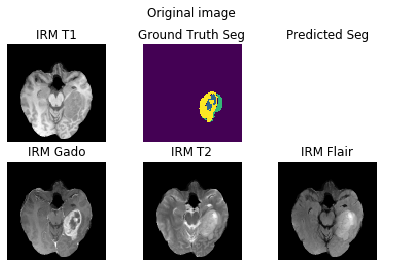

In [0]:
k = 3

irms, masks, patient = val_loader.__iter__().next()

# irms is a list of a numpy array of shape [Batch * W*H*Modality]
irm = irms[0,:].numpy()
mask = masks[0,:].numpy()

fig = plot(irm, mask)
fig.suptitle('Original image')
fig.savefig(save_path + 'orig.png')

Axial Flip 

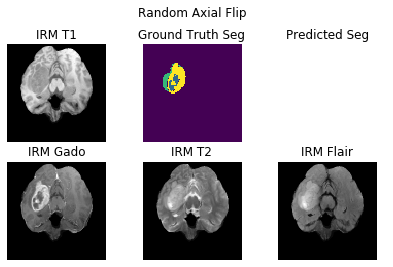

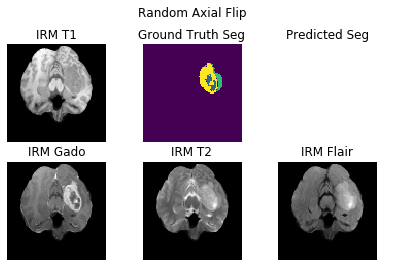

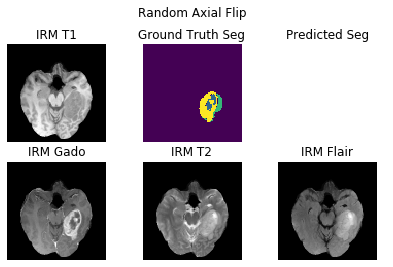

In [0]:
flip = AxialFlip()
for i in range(k):

    (new_irm, new_mask) = flip((irm, mask))

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random Axial Flip')
    fig.savefig(save_path + 'Axial_Flip{}.png'.format(k))

90° Rotation 

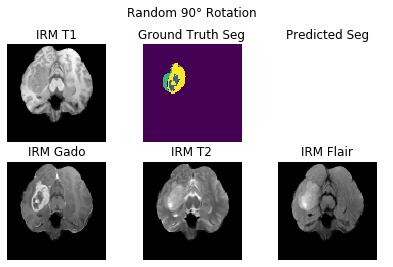

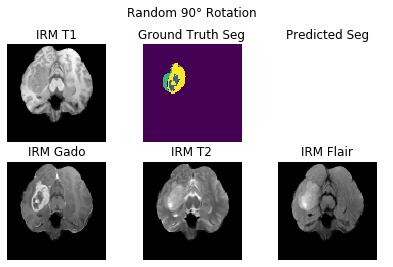

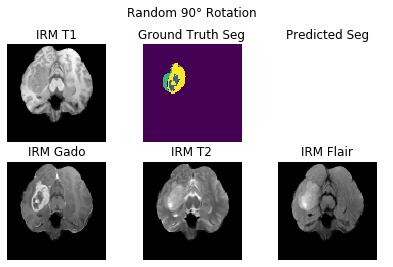

In [0]:
random90rotation = RandomRotation90() 
for i in range(k):

    (new_irm, new_mask) = random90rotation((irm, mask))

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random 90° Rotation')
    fig.savefig(save_path + 'Random90Rotation{}.png'.format(k))

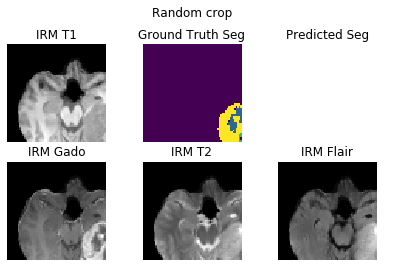

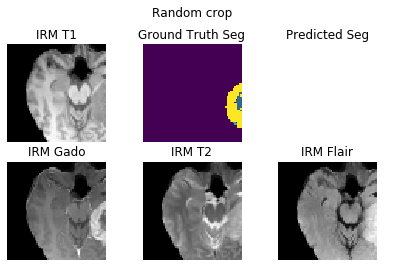

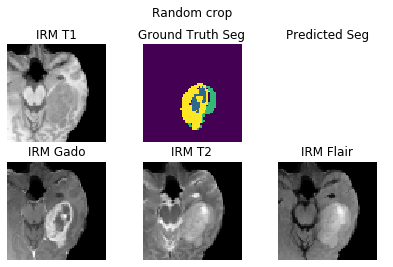

In [0]:
randomcrop = RandomCrop((64, 64)) 
for i in range(k):

    (new_irm, new_mask) = randomcrop((irm, mask))

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random crop')
    fig.savefig(save_path + 'Random90Rotation{}.png'.format(k))

Random Rotation with +/- 30°

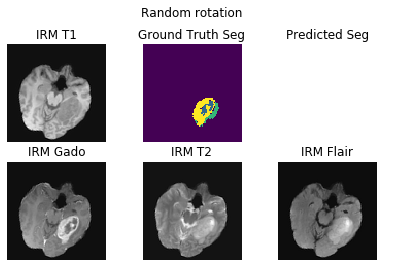

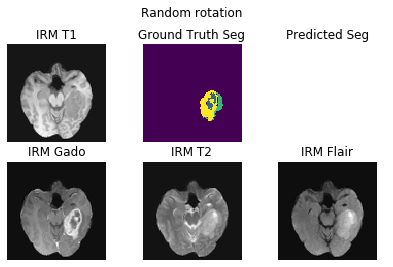

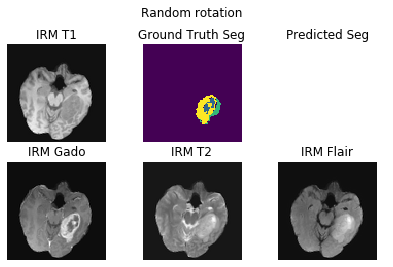

In [0]:
rotate = AffineTransform(theta=30)

for i in range(k):
    

    (new_irm, new_mask) = rotate((irm, mask))

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random rotation')
    fig.savefig(save_path + 'Rotation{:.1f}.png'.format(i))


Random Translation 

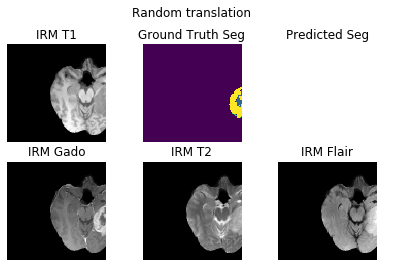

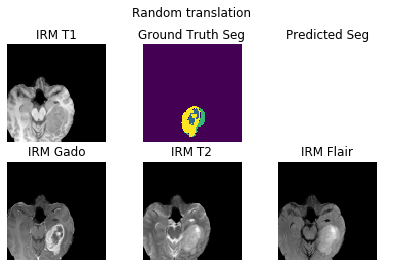

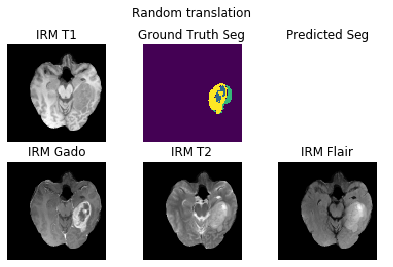

In [0]:
translate = AffineTransform(max_translation=30)

for i in range(k):
    new_irm, new_mask  = translate((irm, mask))

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random translation')
    fig.savefig(save_path + 'Translation_{}.png'.format(i))

Random Zoom

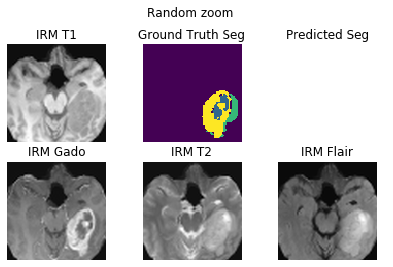

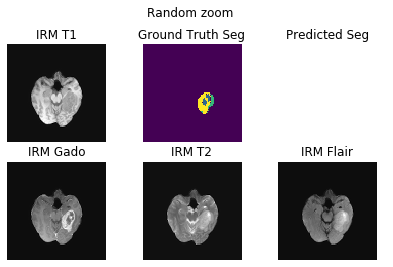

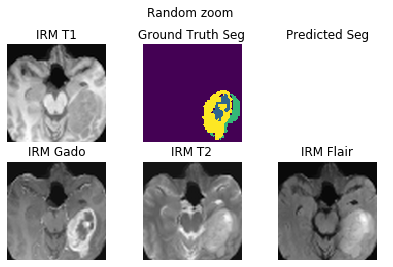

In [0]:
zoom = AffineTransform(max_zoom=0.5)

for i in range(k):
    (new_irm, new_mask)  = zoom((irm, mask))

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random zoom ')
    fig.savefig(save_path + 'Zoom_{}.png'.format(k))

All transformations

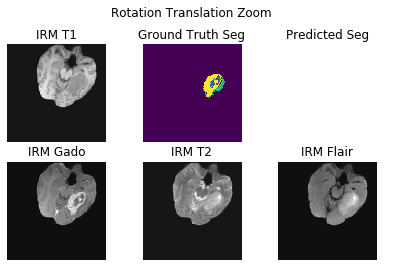

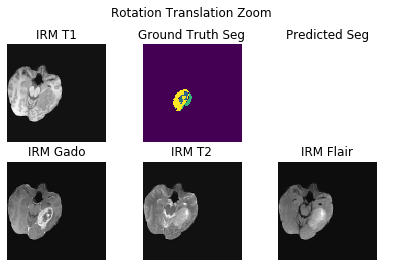

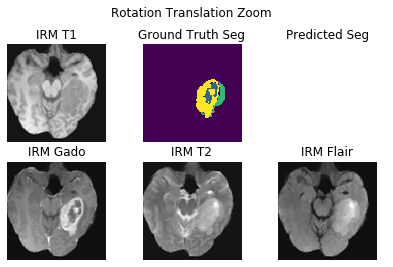

In [0]:
affine_transform = AffineTransform(theta=30, max_translation=30,
                       max_zoom=0.5)

for i in range(k):
    (new_irm, new_mask)  = affine_transform((irm, mask))

    fig = plot(new_irm, new_mask)
    fig.suptitle('Rotation Translation Zoom')
    fig.savefig(save_path + 'All_transforms{}.png'.format(i))

[Solution](#scrollTo=37wKpCWCqFeL&line=7&uniqifier=1)


## Exercice 9 : Train with data augmentation

Relaunch a new training with data augmentation. The training will take more time than during the previous training.

In [0]:
transforms_list = [AffineTransform(theta=15, max_translation=15, max_zoom=0.3),
                   AxialFlip(), RandomRotation90(), RandomCrop((64, 64))
                   ]

transformation = torchvision.transforms.Compose(transforms_list)
train_Dataset = SegmentationDataset(train_IDs, data_path=data_folder,
                                    transform=transformation
                                    )

val_Dataset = SegmentationDataset(val_IDs, data_path=data_folder,
                                  transform=transformation
                                  )

train_loader_data_augment = torch.utils.data.DataLoader(train_Dataset, 
                                           batch_size=batch_size, shuffle=True,
                                           drop_last=True)

val_loader_data_augment = torch.utils.data.DataLoader(val_Dataset,
                                         batch_size=batch_size, drop_last=True) 


In [0]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = UNet(n_channels=4, n_classes=4) # Create model
model.to(device) # move model to the right device

criterion = mean_dice_loss # Choose loss function
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) # Choose optimize
    
if tensorboard:
    log_dir = tensorboard_folder + session_name + '/'
    if not os.path.isdir(log_dir):
        os.makedirs(log_dir)
    writer = torch.utils.tensorboard.SummaryWriter(log_dir)
else:
    writer = None

for epoch in range(epochs):  # loop over the dataset multiple times
    print('******** Epoch [{}/{}]  ********'.format(epoch+1, epochs+1))
    print(session_name)

    # train for one epoch
    model.train()
    print('Training')
    train_loop(train_loader_data_augment, model, criterion,
               optimizer, writer, epoch)

    # evaluate on validation set
    print('Validation')
    with torch.no_grad():
        model.eval()
        val_loss = train_loop(val_loader_data_augment, model, criterion,
                              optimizer, writer, epoch)

    if save_model and epoch % save_frequency == 0:
        save_checkpoint({'epoch': epoch,
                        'state_dict': model.state_dict(),
                         'val_loss': val_loss,
                         'optimizer': optimizer.state_dict()}, model_path)
        

******** Epoch [1/11]  ********
Test_session_02.13 12h55
Training
[Train] Epoch: [1][5/106]	Dice Loss 0.5902 (Average 0.6714) 	Batch Time 1.1199 (Average 1.1593) 	
[Train] Epoch: [1][10/106]	Dice Loss 0.4129 (Average 0.5711) 	Batch Time 1.1521 (Average 1.1523) 	
[Train] Epoch: [1][15/106]	Dice Loss 0.2524 (Average 0.4845) 	Batch Time 1.2544 (Average 1.1654) 	
[Train] Epoch: [1][20/106]	Dice Loss 0.2048 (Average 0.4166) 	Batch Time 1.1169 (Average 1.1547) 	
[Train] Epoch: [1][25/106]	Dice Loss 0.1736 (Average 0.3698) 	Batch Time 1.2975 (Average 1.1610) 	
[Train] Epoch: [1][30/106]	Dice Loss 0.1568 (Average 0.3346) 	Batch Time 1.1514 (Average 1.1561) 	
[Train] Epoch: [1][35/106]	Dice Loss 0.1452 (Average 0.3078) 	Batch Time 1.1317 (Average 1.1512) 	
[Train] Epoch: [1][40/106]	Dice Loss 0.1237 (Average 0.2854) 	Batch Time 1.1150 (Average 1.1472) 	
[Train] Epoch: [1][45/106]	Dice Loss 0.1108 (Average 0.2669) 	Batch Time 1.1196 (Average 1.1430) 	
[Train] Epoch: [1][50/106]	Dice Loss 0.0944 

## Exercice 10 : Comparaison of training curves

Two models trained for 200 epochs are given in the folder /content/TP3/tensorboard_logs/. The only difference between the two models in that one is using data augmentation and the other not. 
Open tensorboard and compare the loss, accuracy and prediction for the two models.


In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir /content/TP3/tensorboard_logs/

# Part 4 : Prediction and Evaluation

After training the model we have to perform two steps : the prediction of the segmentation using a model trained and the evaluation of the performance of the network.

The evaluation of the network should be done on the validation set (which have not been seen by the network during the training). The test set will only be used when all the parameters of the network are chosen. 

## Exercice 11 : Prediction and returning to original space

In this exercice, we will load a network and use the function **predict()** to calculate the predicted segmentation. The predicted segmentation will have a shape (96, 96, 4). We need to transform it back to the 3D shape (155, 240, 240) to perform the evaluation. 
The steps to calculate the prediction will be : 
- Load an image X, with the function **load_image**
- Apply **model.predict()** on X
- Apply **get_mask2original_shape()** to the prediction

**Questions**
- Study the function **load_image(patient)**. Try to understand what this function is doing. Try to guess the shape of all the different variable (temp_array, array, X). Then use the function **print** and **shape** to verify your guess. 
- Study the function **get_mask2original_shape()**. What are doing the different functions inside it ? Try to guess the different shape



In [0]:
train_split, val_split, test_split = load_split(sets_path)
(train_IDs, val_IDs,
 test_IDs) = generate_IDs(train_split, val_split, test_split,
                          0, csv_path)

transformation=None
test_Dataset = SegmentationDataset(test_IDs, data_path=data_folder,
                                  transform=transformation
                                  )

test_loader = torch.utils.data.DataLoader(test_Dataset,
                                         batch_size=batch_size, drop_last=False) 


In [0]:
test_path = '/content/TP3/origin_data/'
data_path = '/content/TP3/data/'
patients = os.listdir(test_path)
patient = patients[0]
z_max = 78


def get_mask2original_shape(predict_mask):
  print(predict_mask.shape)
  mask = np.zeros(shape=(155,240, 240))
  res = skimage.transform.resize(predict_mask, (155, 4, 192, 192))
  print('Shape after rescale : {}'.format(res.shape))
  res = res > 0.5
  res = np.argmax(res, axis=1)
  mask[:, 24:-24, 24:-24] = res
  mask[mask == 3] = 4
  return mask.astype('int')



In [0]:
def predict(loader, model, batch_size=1):
    preds = {}
    for i, sample in tqdm(enumerate(loader, 1)):
        # Take variable and put them to GPU
        (irms, masks, patients) = sample
        irms = to_var(irms.float(), device)
        masks = to_var(masks.float(), device)
    
        # compute output
        pred_masks = model(irms)

        # Put the predictions in a dictionnary with one key being the 
        # patient and the z slice
        n = pred_masks.shape[0]
        for j in range(n):
          patient, z_slice = patients[0][j], patients[1][j]
          name = patient + '_z_' + str(to_numpy(z_slice))
          preds[name] = to_numpy(pred_masks[j])
    return preds

def reconstruct_patient(preds, patient):
  '''
    From the dictionnary with prediction find the slice corresponding to 
    one patient and construct a 3D matrix of shape 77*96*96
  '''
  X = []
  for i in range(z_max):

    name = patient + '_z_' + str(i)
    array_slice = preds[name]
    X.append(array_slice)

  X = np.stack(X, axis=0) 
  return X


In [0]:
model.eval()
with torch.no_grad():
  preds = predict(test_loader, model, batch_size=batch_size)


52it [00:28,  1.81it/s]


(78, 4, 96, 96)
Shape after rescale : (155, 4, 192, 192)


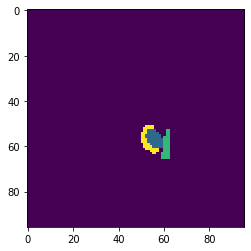

In [0]:
predict_mask = reconstruct_patient(preds, patient)
plt.imshow(np.argmax(predict_mask[50, ...], axis=0))
predict_mask = get_mask2original_shape(predict_mask)



[Solution](#scrollTo=gGcVKKoZm8If)


## Exercice 12 : Visual Comparaison

We will do a visual comparaison between the predicted mask and the groundtruth. We will perform the comparaison with **Matplotlib** (python librariry for graph) and a software specialised for medical imaging vizualisation **3D Slicer** (https://www.slicer.org/)

**Questions**
- Load the groundtruth mask (in folder /content/TP3/origin_data) and using the function **plt.subplot**, **plt.imshow** and **plt.title**, plot the predicted mask and the groundtruth side by side
- Change the value of the **z_slice** parameter to explore the segmentation slice by slice
- Study the function **numpy2nifti**. What does it do ? Apply it and save the predicted mask as a nifti files. Download the MRI, the groundtruth segmentation and the predicted segmentation and download the software 3D Slicer. Open the nifti files in 3D Slicer and compare the images.

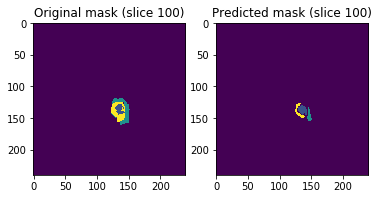

In [0]:
# Compare visual plot of prediction and original mask 
import matplotlib.pyplot as plt

patient_folder = os.path.join(test_path,patient)
orig_image = sitk.ReadImage(os.path.join(patient_folder, 
                                    patient  + '_seg' + suffix))
orig_mask = sitk.GetArrayFromImage(orig_image)

z_slice=100

plt.subplot(1,2,1)
plt.imshow(orig_mask[z_slice, :,: ], vmin=0, vmax=4)
plt.title('Original mask (slice {})'.format(z_slice))

plt.subplot(1,2,2)
plt.imshow(predict_mask[z_slice, :,: ], vmin=0, vmax=4)
plt.title('Predicted mask (slice {})'.format(z_slice));

In [0]:
def numpy2sitk(predict_mask, orig_img):
  '''
    Input : predict_mask of type numpy array
            orig_img of type SimpleITK image
    Output : new_img of type SimpleITK image 
  '''
  new_img = sitk.GetImageFromArray(predict_mask)
  new_img.SetDirection(orig_img.GetDirection())
  new_img.SetOrigin(orig_img.GetOrigin())
  new_img.SetSpacing(orig_img.GetSpacing())
  return new_img

predict_img = numpy2sitk(predict_mask, orig_image)
path = os.path.join(patient_folder, patient + '_predict_seg' + suffix)
sitk.WriteImage(predict_img, path)

[Solution](#scrollTo=JVwUv_NEm8ha&line=7&uniqifier=1)

## Exercice 13 : Metrics 

We will now calculate the evaluation metrics to assess the performance of our model. We will use 3 metrics : the sensitivity (also called true positive rate), the Specificity (also called true negative rate) and the dice score (different of the dice loss used during the training). 

We will evaluate the metrics on the 5 patients in the folder /content/TP3/origin_data. In the reality, we should evaluate the metrics for all the patient of the validation set (the test set will only be used when we choose the best model and we publish our results).

**Questions :**
- Using the previous **predict_mask** and **orig_mask** array, calculate the metrics. You just need to apply the function **evalAllSample()**. Print the result. 
- Using, a for loop and all the functions defined in the part 4, calculate the metrics for the 5 patients in the folder /content/TP3/origin_data. You should print the average Dice value for each category (WT, ET, TC) 

In [0]:
import pandas as pd

def metrics(mask_, gt_):
  '''
    Taking to binary array of same shape as input
    This function compute the confusion matrix and use it to calculate 
    Dice metrics, Sensitivity and Specificity
    Input : mask_, gt_ numpy array of identic shape (only 1 and 0)
    Output : List of 3 scores
  '''
  lnot = np.logical_not
  land = np.logical_and

  true_positive = np.sum(land((mask_), (gt_)))
  false_positive = np.sum(land((mask_), lnot(gt_)))
  false_negative = np.sum(land(lnot(mask_), (gt_)))
  true_negative = np.sum(land(lnot(mask_), lnot(gt_)))

  M = np.array([[true_negative, false_negative],
                [false_positive, true_positive]]).astype(np.float64)
  metrics = {}
  metrics['Sensitivity'] = M[1, 1] / (M[0, 1] + M[1, 1])
  metrics['Specificity'] = M[0, 0] / (M[0, 0] + M[1, 0])
  metrics['Dice'] = 2 * M[1, 1] / (M[1, 1] * 2 + M[1, 0] + M[0, 1])
  # metrics may be NaN if denominator is zero! use np.nanmean() while
  # computing average to ignore NaNs.

  return [metrics['Dice'], metrics['Sensitivity'], metrics['Specificity']]


def evalAllSample(mask_, gt_):
  '''
    This functions takes as input two numpy array with labels between
    0, 1, 2 and 4 and calculate the metrics as defined in BraTS data challenge
    mask_ and gt_ should be array of int
  '''
  # whole tumor (labels 1,2,4)
  mask_wt, gt_wt = (np.array([0, 1, 1, 0, 1])[mask_], 
                    np.array([0, 1, 1, 0, 1])[gt_])
  wt_metrics = metrics(mask_wt, gt_wt)

  # tumor core (labels 1,4)
  mask_tc, gt_tc = (np.array([0, 1, 0, 0, 1])[mask_], 
                    np.array([0, 1, 0, 0, 1])[gt_])
  tc_metrics = metrics(mask_tc, gt_tc)

  # enhancing tumor (label 4)
  mask_et, gt_et = (np.array([0, 0, 0, 0, 1])[mask_], 
                    np.array([0, 0, 0, 0, 1])[gt_])
  et_metrics = metrics(mask_et, gt_et)
  
  return pd.DataFrame({'wt': wt_metrics, 'tc': tc_metrics, 'et': et_metrics},
                      index=['Dice', 'Sensitivity', 'Specificity'])



In [0]:
wt_dice_list = []
et_dice_list = []
tc_dice_list = []

model.eval()
with torch.no_grad():
  preds = predict(test_loader, model, batch_size=batch_size)

for patient in patients:

  patient_folder = os.path.join(test_path,patient)
  orig_image = sitk.ReadImage(os.path.join(patient_folder, 
                                           patient  + '_seg' + suffix))
  orig_mask = sitk.GetArrayFromImage(orig_image)
  
  predict_mask = reconstruct_patient(preds, patient)
  print(predict_mask.shape)
  predict_mask = get_mask2original_shape(predict_mask)
  
  print('*********** {} ***********'.format(patient))
  scores = evalAllSample(predict_mask, orig_mask)
  print(scores)
  print()

  wt_dice_list.append(scores.loc['Dice', 'wt'])
  et_dice_list.append(scores.loc['Dice', 'et'])
  tc_dice_list.append(scores.loc['Dice', 'tc'])


52it [00:18,  2.84it/s]


(78, 4, 96, 96)
(78, 4, 96, 96)
Shape after rescale : (155, 4, 192, 192)
*********** BraTS19_TCIA01_131_1 ***********
                   wt        tc        et
Dice         0.628243  0.466054  0.247310
Sensitivity  0.467960  0.337499  0.148210
Specificity  0.999907  0.999849  0.999949

(78, 4, 96, 96)
(78, 4, 96, 96)
Shape after rescale : (155, 4, 192, 192)
*********** BraTS19_CBICA_AWV_1 ***********
                   wt        tc        et
Dice         0.522987  0.576452  0.436299
Sensitivity  0.412045  0.478675  0.393919
Specificity  0.999556  0.999698  0.999657

(78, 4, 96, 96)
(78, 4, 96, 96)
Shape after rescale : (155, 4, 192, 192)
*********** BraTS19_TCIA10_442_1 ***********
                   wt        tc        et
Dice         0.651648  0.552995  0.373840
Sensitivity  0.501630  0.398631  0.810361
Specificity  0.999502  0.999500  0.999388

(78, 4, 96, 96)
(78, 4, 96, 96)
Shape after rescale : (155, 4, 192, 192)
*********** BraTS19_CBICA_ANP_1 ***********
                   wt  

In [0]:
  predict_mask = reconstruct_patient(preds, patient)
  print(predict_mask.shape)

(78, 5, 96, 96)


In [0]:
print('Whole Tumor Dice : {:.2f}'.format(np.mean(wt_dice_list)))
print('Tumor Core Dice : {:.2f}'.format(np.mean(et_dice_list)))
print('Enhancing Tumor Dice : {:.2f}'.format(np.mean(tc_dice_list)))

Whole Tumor Dice : 0.61
Tumor Core Dice : 0.42
Enhancing Tumor Dice : 0.56


[Solution](#scrollTo=r_pVQq5zm_3f&line=5&uniqifier=1)

# Part 5 : Subsidiary Question

Without using the code given in the exercice 5, implement yourself the unet, using the different layers from the keras library and the article : https://arxiv.org/pdf/1505.04597.pdf


In [0]:

def unet(input_size = (256,256,1)):
  '''
    Function taken in : https://github.com/zhixuhao/unet
  '''
  inputs = Input(input_size)
  conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same')(inputs)
  conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv1)
  pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

  conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same')(pool1)
  conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same')(conv2)
  pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

  conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same')(pool2)
  conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same')(conv3)
  pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

  conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same')(pool3)
  conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same')(conv4)
  drop4 = Dropout(0.5)(conv4)
  pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

  conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same')(pool4)
  conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same')(conv5)
  drop5 = Dropout(0.5)(conv5)

  up6 = Conv2D(512, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(drop5))
  merge6 = concatenate([drop4,up6], axis = 3)
  conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same')(merge6)
  conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same')(conv6)

  up7 = Conv2D(256, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv6))
  merge7 = concatenate([conv3,up7], axis = 3)
  conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same')(merge7)
  conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same')(conv7)

  up8 = Conv2D(128, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv7))
  merge8 = concatenate([conv2,up8], axis = 3)
  conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same')(merge8)
  conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same')(conv8)

  up9 = Conv2D(64, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv8))
  merge9 = concatenate([conv1,up9], axis = 3)
  conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same')(merge9)
  conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv9)
  conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same')(conv9)
  conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)

  model = Model(input = inputs, output = conv10)

  return model 

[Solution](#scrollTo=hk4LQJOXnBaE&line=56&uniqifier=1)

# Part 6 : Solution

 ## Exercice 1

```python
/import numpy as np
import os
path = '/content/epu_ia_2019/'
train_set = np.loadtxt(path + 'datasets/train.txt',dtype=str)
validation_set = np.loadtxt(path + 'datasets/val.txt',dtype=str)
test_set = np.loadtxt(path + 'datasets/test.txt',dtype=str)

# Train_set, validation_set and test_set are list of patients
print('Train set : {}'.format(train_set[:5])) # Print the first 5 patients of train_set
print('Train set lenght : {}'.format(len(train_set)))
print('Validation set lenght : {}'.format(len(validation_set)))
print('Test set lenght : {}'.format(len(test_set)))
```

[Return to code](#scrollTo=pWzV-qrfZ0nk)



 ## Exercice 2
```python
# The data is store in the folder /content/epu_ia_2019/data/
data_path = '/content/epu_ia_2019/data/'
files = os.listdir(data_path) # All the files in the folder /content/epu_ia_2019/data/
print('Content of the folder : {}'.format(files[:5]))
print('Lenght of the folder : {}'.format(len(files)))

# For each patient we have 4 modality and the segmentation in the folder :
# t1, t2, flair, t1_ce (gado) and seg. 
# We also have a file for each slice along the z axis ()
patient = 'BraTS19_2013_0_1/'
patient_path = os.path.join(data_path, patient)
patient_files = os.listdir(patient_path)
print('Number of files for each patient : {}'.format(len(patient_files) ))
print('Number of slices : {}'.format(len(patient_files) / 5))
print('The first five files of the folder : {}'.format(patient_files[:5]))
```

[Return to code](#scrollTo=K8QKnQ_G3Nty)

 ## Exercice 3
```python
import os
import SimpleITK as sitk
orig_data_path = '/content/epu_ia_2019/origin_data/'

patients = ['BraTS19_CBICA_ANP_1', 'BraTS19_CBICA_AWV_1', 'BraTS19_TCIA01_131_1',
            'BraTS19_TCIA10_442_1']

modalities = ['_t1', '_t2', '_flair', 't1ce', 'seg']
suffix = '.nii.gz'
patient = patients[0]
modality = modalities[0]
patient_folder = os.path.join(orig_data_path,patient) 
# We use the librairy sitk to open the nifti images
image = sitk.ReadImage(os.path.join(patient_folder, patient + modality + suffix))

print(type(image))
# Print geometrical information
print('Image Direction : {}'.format(image.GetDirection()))
print('Image Spacing : {}'.format(image.GetSpacing()))
print('Image Origin : {}'.format(image.GetOrigin()))

print(image.GetPixel(0, 0, 0))

# Get all the information in the meta data
keys = image.GetMetaDataKeys()
print('Metadata :')
for key in keys:
  print('{} : {}'.format(key, image.GetMetaData(key)))

# Convert the sitk image 
array = sitk.GetArrayFromImage(image)
print(type(array)) # Type of the image
print(array.shape)
print(array[0, 0, 0])
```

[Return to code](#scrollTo=Quyx7V8lxNqi&line=3&uniqifier=1)

 ## Exercice 4
```python
import matplotlib.pyplot as plt

orig_data_path = '/content/epu_ia_2019/origin_data/'
patient = patients[0]
modality = modalities[0]
patient_folder = os.path.join(orig_data_path,patient) 
# We use the librairy sitk to open the nifti images
image = sitk.ReadImage(os.path.join(patient_folder, patient + modality + suffix))
orig_array = sitk.GetArrayFromImage(image)
print('Orig array shape : {}'.format(orig_array.shape))

###
data_path = '/content/epu_ia_2019/data/'
patient_folder = os.path.join(data_path,patient)
z_slice = 35
path = os.path.join(patient_folder, patient + modality + '_z_' + str(z_slice) + suffix)
image = sitk.ReadImage(path)
processed_array = sitk.GetArrayFromImage(image)
print('Processed array shape : {}'.format(processed_array.shape))

plt.subplot(1, 2, 1)
plt.imshow(orig_array[z_slice*2, :, :], cmap='gray')
plt.title('Original array')
plt.subplot(1, 2, 2)
plt.imshow(processed_array, cmap='gray')
plt.title('Processed array')
```

[Return to code](#scrollTo=CTfImwXE5UVO)


 ## Exercice 5
```python

def DownConvBlock(x, nConv, nChans, maxpool=False, dropout=False, 
                  activation='relu'):
    '''

    '''
    out =  Conv2D(nChans, 3, activation = activation, padding = 'same')(x)
    
    for i in range(nConv -1):
        out = Conv2D(nChans, 3, activation = activation, padding = 'same')(out)
    
    if dropout:
        out = Dropout(0.5)(out)
        
    if maxpool:
        maxpool = MaxPooling2D(pool_size=(2, 2))(out)
        
        return out, maxpool
    
    else:
        return out 

def UpConvBlock(x, skip_x, nConv, nChans, dropout=False, activation='relu'):
    '''

    '''
    out = UpSampling2D(size = (2,2))(x)
    out = Conv2D(nChans, 2, activation = activation, padding = 'same')(out)
    
    merge = Concatenate(axis=3)([out, skip_x])
    
    out = Conv2D(nChans, 3, activation = activation, padding = 'same')(merge)
    for i in range(nConv -1):
        out = Conv2D(nChans, 3, activation = activation, padding = 'same')(out)

    return out
```

[Return to code](#scrollTo=5qDJ20x-8jPJ)

 ## Exercice 6
```python

def DownConvBlock(x, nConv, nChans, maxpool=False, dropout=False, 
                  activation='relu'):
    '''

    '''
    out =  Conv2D(nChans, 3, activation = activation, padding = 'same')(x)
    
    for i in range(nConv -1):
        out = Conv2D(nChans, 3, activation = activation, padding = 'same')(out)
    
    if dropout:
        out = Dropout(0.5)(out)
        
    if maxpool:
        maxpool = MaxPooling2D(pool_size=(2, 2))(out)
        
        return out, maxpool
    
    else:
        return out 

def UpConvBlock(x, skip_x, nConv, nChans, dropout=False, activation='relu'):
    '''

    '''
    out = UpSampling2D(size = (2,2))(x)
    out = Conv2D(nChans, 2, activation = activation, padding = 'same')(out)
    
    merge = Concatenate(axis=3)([out, skip_x])
    
    out = Conv2D(nChans, 3, activation = activation, padding = 'same')(merge)
    for i in range(nConv -1):
        out = Conv2D(nChans, 3, activation = activation, padding = 'same')(out)

    return out
```

[Return to code](#scrollTo=LNtCpyZv8t8L)

## Exercice 7
```python
# loss functions : https://keras.io/losses/
loss = generalised_dice if loss_function == 'dice_loss' else losses.categorical_crossentropy

# optimizer :  https://keras.io/optimizers/
# other optimiser available : SGD, RMSprop etc..
optimizer = optimizers.Adam(lr=learning_rate)

# metrics
model = unet(image_size, n_modality, n_labels, first_layer_channels)

# Compile model
model.compile(loss=loss, optimizer=optimizer, metrics=['accuracy'])


# Train the model
history = model.fit_generator(train_Gen, epochs=epochs, validation_data=val_Gen, callbacks=callbacks_list)

```

[Return to code](#scrollTo=CiYKEfpIcxHq)

## Exercice 8
```python
k = 3

irms, masks = val_Gen.__getitem__(0)

# irms is a list of a numpy array of shape [Batch * W*H*Modality]
irms = irms[0][0]
masks = masks[0][0]

fig = plot(irms, masks)
fig.suptitle('Original image')
fig.savefig(save_path + 'Orig.png')

#Axial Flip
for i in range(k):

    (new_irm, new_mask) = axial_flip(irms, masks)

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random Axial Flip')
    fig.savefig(save_path + 'Axial_Flip{}.png'.format(k))

# 90 Rotation
for i in range(k):

    (new_irm, new_mask) = random90rotation(irms, masks)

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random 90° Rotation')
    fig.savefig(save_path + 'Random90Rotation{}.png'.format(k))

# Random Rotation +/-30°
for i in range(k):
    (transformation_matrix, theta) = RandomRotation(30, debug=True)

    (new_irm, new_mask) = apply_affine_transform(irms, masks, transformation_matrix)

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random rotation : {:.1f}°'.format(theta))
    fig.savefig(save_path + 'Rotation{:.1f}.png'.format(theta))

# Translation
for i in range(k):
    transformation_matrix, (tx, ty) = RandomTranslation(30, debug=True)

    new_irm, new_mask = apply_affine_transform(irms, masks, transformation_matrix)

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random translation : x={} y={}'.format(tx, ty))
    fig.savefig(save_path + 'Translation_{}_{}.png'.format(tx, ty))

# Zoom 
for i in range(k):
    (transformation_matrix, zoom) = RandomZoom(0.5, debug=True)

    (new_irm, new_mask) = apply_affine_transform(irms, masks, transformation_matrix)

    fig = plot(new_irm, new_mask)
    fig.suptitle('Random zoom : {:.2f}'.format(zoom))
    fig.savefig(save_path + 'Zoom_{:.2f}.png'.format(zoom))

# All transformations
for i in range(k):
    (transformation_matrix, theta) = RandomRotation(30, debug=True)
    
    (transformation_matrix, 
     (tx, ty)) = RandomTranslation(30,  transformation_matrix, debug=True)
    
    (transformation_matrix,
      zoom) = RandomZoom(0.5, transformation_matrix, debug=True)

    (new_irm,
      new_mask) = apply_affine_transform(irms, masks, transformation_matrix)

    fig = plot(new_irm, new_mask)
    fig.suptitle('Rotation : {:.1f} Translation : {}::{} Zoom : {:.2f}'.format(theta, tx, ty,zoom))
    fig.savefig(save_path + 'All_transforms{}.png'.format(i))
```

[Return to code](#scrollTo=U5zrwq0EFT-S)

## Exercice 11
```python
def load_image(patient):
  patient_folder = os.path.join(data_path,patient)
  X = []
  for z in range(z_max):
    temp_array = []
    for modality in modalities:

      image = sitk.ReadImage(os.path.join(patient_folder, 
                                        patient  + modality + '_z_' + str(z) + suffix))
      array = sitk.GetArrayFromImage(image) # Array as the shape 96 * 96 
      temp_array.append(array)

    temp_array = np.stack(temp_array, axis=-1) # Shape 96 * 96 * 4 (we stack the 4 modality together)
  
    # Don't forget to normalize your data
    temp_array = normalize(temp_array)
    X.append(temp_array)

  X = np.stack(X, axis=0) # Shape 77 * 96 * 96 * 4 (we stack the slice together)
  return X

def get_mask2original_shape(predict_mask):
  
  mask = np.zeros(shape=(155,240, 240))
  res = skimage.transform.resize(predict_mask, (155, 192, 192, 4))
  print('Shape after rescale : {}'.format(res.shape))
  res = res > 0.5
  res = np.argmax(res, axis=-1)
  mask[:, 24:-24, 24:-24] = res
  mask[mask == 3] = 4
  return mask.astype('int')

X = load_image(patient)
print(X.shape)

predict_mask = model.predict(X, batch_size=16)
predict_mask = get_mask2original_shape(predict_mask)
print(predict_mask.shape)

```

[Return to code](#scrollTo=cnTIU3BrlhsY&line=8&uniqifier=1)

## Exercice 12
```python
# Compare visual plot of prediction and original mask 
import matplotlib.pyplot as plt

patient_folder = os.path.join(test_path,patient)
orig_image = sitk.ReadImage(os.path.join(patient_folder, 
                                    patient  + '_seg' + suffix))
orig_mask = sitk.GetArrayFromImage(orig_image)

z_slice=90

plt.subplot(1,2,1)
plt.imshow(orig_mask[z_slice, :,: ], vmin=0, vmax=4)
plt.title('Original mask (slice {})'.format(z_slice))

plt.subplot(1,2,2)
plt.imshow(predict_mask[z_slice, :,: ], vmin=0, vmax=4)
plt.title('Predicted mask (slice {})'.format(z_slice))

predict_img = numpy2sitk(predict_mask, orig_image)
path = os.path.join(patient_folder, patient + '_predict_seg' + suffix)
sitk.WriteImage(predict_img, path)

```

[Return to code](#scrollTo=hjT3WF0el3yb&line=3&uniqifier=1)

## Exercice 13
```python
wt_dice_list = []
et_dice_list = []
tc_dice_list = []

for patient in patients:

  patient_folder = os.path.join(test_path,patient)
  orig_image = sitk.ReadImage(os.path.join(patient_folder, 
                                           patient  + '_seg' + suffix))
  orig_mask = sitk.GetArrayFromImage(orig_image)

  X = load_image(patient)
  predict_mask = model.predict(X, batch_size=16)
  predict_mask = get_mask2original_shape(predict_mask)
  
  print('*********** {} ***********'.format(patient))
  scores = evalAllSample(predict_mask, orig_mask)
  print(scores)
  print()

  wt_dice_list.append(scores.loc['Dice', 'wt'])
  et_dice_list.append(scores.loc['Dice', 'et'])
  tc_dice_list.append(scores.loc['Dice', 'tc'])


print('Whole Tumor Dice : {:.2f}'.format(np.mean(wt_dice_list)))
print('Tumor Core Dice : {:.2f}'.format(np.mean(et_dice_list)))
print('Enhancing Tumor Dice : {:.2f}'.format(np.mean(tc_dice_list)))
```

[Return to code](#scrollTo=saALPYgDmFzt&line=3&uniqifier=1)

## Subsidiary Question
```python
def unet(input_size = (256,256,1)):
  '''
    Function taken in : https://github.com/zhixuhao/unet
  '''
  inputs = Input(input_size)
  conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same')(inputs)
  conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv1)
  pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

  conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same')(pool1)
  conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same')(conv2)
  pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

  conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same')(pool2)
  conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same')(conv3)
  pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

  conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same')(pool3)
  conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same')(conv4)
  drop4 = Dropout(0.5)(conv4)
  pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

  conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same')(pool4)
  conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same')(conv5)
  drop5 = Dropout(0.5)(conv5)

  up6 = Conv2D(512, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(drop5))
  merge6 = concatenate([drop4,up6], axis = 3)
  conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same')(merge6)
  conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same')(conv6)

  up7 = Conv2D(256, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv6))
  merge7 = concatenate([conv3,up7], axis = 3)
  conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same')(merge7)
  conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same')(conv7)

  up8 = Conv2D(128, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv7))
  merge8 = concatenate([conv2,up8], axis = 3)
  conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same')(merge8)
  conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same')(conv8)

  up9 = Conv2D(64, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv8))
  merge9 = concatenate([conv1,up9], axis = 3)
  conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same')(merge9)
  conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv9)
  conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same')(conv9)
  conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)

  model = Model(input = inputs, output = conv10)

  return model 
```

[Return to code](#scrollTo=3YqJqcAxI6Te&line=4&uniqifier=1)